## Week 3 Imputation and EDS

In [1]:
# AUTHOR: Akhila Reddy Kommiti
# COURSE: ADTA 5410
# PROGRAM: Assignment 2
# PURPOSE: To analyse the Oil production data set using advancedanalytics.
#
# PROCESS: By setting the target variable as Log_Cum_Production and cleaning 
#the data such as removing missing values and making use of the advancedanalytics library 
#to impute the data.

# OUTPUT: Plotted various graphs to visualize the correlation and distribution 
#of the  variables 

# HONOR CODE: On my honor, I have neither given
# nor received unauthorized aid on this academic work, to
# include the assistance from others in the class, the use of
# generative AI to produce the original code, or the use of
# code obtained from external sources such as stacked
# overflow, in example. I realize the use of unauthorized
# will at a minimum result in a zero for this assignment and
# and may lead to further honor code disciplinary results

### Install the Advanced Analytics library

In [2]:
!pip install AdvancedAnalytics

## Import packages for analysis

In [3]:
# Pandas library for data manipulation and analysis, especially for DataFrames
import pandas as pd       

# NumPy library for numerical computations and handling arrays
import numpy as np        

# Statsmodels library for estimating and testing statistical models
import statsmodels.api as sm    

# Statsmodels evaluation measures for model performance (e.g., MSE, MAE)
import statsmodels.tools.eval_measures as em    

# SciPy's normal distribution functions for working with statistical distributions
from scipy.stats import norm    

# Matplotlib for creating static, animated, or interactive plots and graphs
import matplotlib.pyplot as plt     

# Scikit-learn function to split datasets into training and testing sets
from sklearn.model_selection import train_test_split   

# AdvancedAnalytics library for data preprocessing (Replace, Impute, Encode) and decision tree imputation
from AdvancedAnalytics.ReplaceImputeEncode import ReplaceImputeEncode, DT  

# AdvancedAnalytics regression functions for linear regression and stepwise regression
from AdvancedAnalytics.Regression import linreg, stepwise  

import seaborn as sns

# Display the updated DataFrame to verify the changes
from IPython.display import display


## Make a data map for imputing

In [4]:
""" **********************************************************************  """
# Start of data map definition
"""  DATA MAP                                                               """

# Attribute map for the dataset. This dictionary maps each attribute (column) to its data type (DT) and acceptable range or categories
attribute_map = {

    # 'obs' is the ID field, where the value should be a positive integer or infinite (1, ∞)
    'Obs':    [DT.ID, (1, np.inf)],

    # 'price' is an Interval field with a valid range of prices between 300 and 20,000
    'Log_Cum_Production':  [DT.Interval, (8, 15)],

    # 'Carat' is an Interval field for carat weight, ranging from 0.2 to 5.5
    'Log_Proppant_LB':  [DT.Interval, (6, 18)],

    # 'cut' is a Nominal (categorical) field with defined quality levels for the diamond cut
    'Log_Carbonate':    [DT.Interval,(-4, +4)],

    # 'color' is a Nominal field with allowed color grades ranging from D to J
    'Log_Frac_Fluid_GL':  [DT.Interval, (7, 18)],

    # 'clarity' is a Nominal field with predefined clarity levels for diamonds
    'Log_GrossPerforatedInterval':[DT.Interval,(4,9)],

    # 'depth' is an Interval field for the depth percentage, with acceptable values between 40 and 80
    'Log_LowerPerforation_xy':  [DT.Interval,(8,10)], 

    # 'table' is an Interval field for the table percentage, ranging between 40 and 100
    'Log_UpperPerforation_xy':  [DT.Interval,(8,10)],

    # 'x' is an Interval field for the length in millimeters, with values between 0 and 11
    'Log_TotalDepth':      [DT.Interval, (8,10)],

    # 'y' is an Interval field for the width in millimeters, with values between 0 and 60
    'N_Stages':      [DT.Interval, (2,14)],

    # 'z' is an Interval field for the depth in millimeters, with values between 0 and 32
    'X_Well':[DT.Interval, (-100,-95)] ,
    'Y_Well':  [DT.Interval, (30,35)],
    'Operator':[DT.Nominal, (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28)],
    'County':[DT.Nominal, (1,2,3,4,5,6,7,8,9,10,11,12,13,14)]    
}

""" **********************************************************************  """
# End of data map definition


' **********************************************************************  '

## Read the data file

In [5]:
"""  READ DATA FILE - diamondswmissing.xlsx                                 """
df = pd.read_excel (r'C:\Users\akhil\Downloads\OilProduction.xlsx')
print("Read", df.shape[0], "observations with the following", \
      df.shape[1], "attributes:\n")

""" **********************************************************************  """

Read 4752 observations with the following 14 attributes:



' **********************************************************************  '

## Set the target and create new dataframe from the RIE

In [6]:
""" **********************************************************************  """
#Setting the target variable
"""  RIE for PRICE as TARGET                                                """
target = "Log_Cum_Production"

# Create an instance of ReplaceImputeEncode (RIE) for data preprocessing
# data_map = attribute_map defines the metadata (data types and ranges) for the dataset
# nominal_encoding='one-hot' applies one-hot encoding to nominal (categorical) variables
# no_impute=[target] specifies that no imputation is to be applied to the target variable 'price'
# interval_scale=None means interval scaling is not applied
# drop=True will drop columns that are not specified in the data map
# display=True enables the display of preprocessing details during execution
rie = ReplaceImputeEncode(data_map=attribute_map, nominal_encoding='one-hot',
        no_impute=[target], interval_scale = None, drop=True, display=True)

# Apply the fit_transform method to the DataFrame (df) using the RIE instance
# This preprocesses the data by replacing, imputing, and encoding, then drops rows with missing values
encoded_df = rie.fit_transform(df).dropna() #drop rows with any missing values
""" **********************************************************************  """



********** Data Preprocessing ***********
Features Dictionary Contains:
11 Interval, 
0 Binary, 
2 Nominal, and 
1 Excluded Attribute(s).

Data contains 4752 observations & 14 columns.


Attribute Counts
.................................. Missing  Outliers
Obs..........................         0         0
Log_Cum_Production...........         1         0
Log_Proppant_LB..............         1         0
Log_Carbonate................         1         0
Log_Frac_Fluid_GL............         1         0
Log_GrossPerforatedInterval..         1         0
Log_LowerPerforation_xy......         1         0
Log_UpperPerforation_xy......         1         0
Log_TotalDepth...............         1         0
N_Stages.....................         1         0
X_Well.......................         1         0
Y_Well.......................         1         0
Operator.....................         1         0
County.......................         1         0


' **********************************************************************  '

## Basic data review using panda display, info and describe

In [7]:
#display the first 5 and last 5 
pd.set_option('display.max_columns', None)
display(encoded_df)  # First and Last 5 rows
print(encoded_df.info())  # Data types and non-null counts
print(encoded_df.describe())  # Summary statistics for numeric columns

,Log_Cum_Production,Log_Proppant_LB,Log_Carbonate,Log_Frac_Fluid_GL,Log_GrossPerforatedInterval,Log_LowerPerforation_xy,Log_UpperPerforation_xy,Log_TotalDepth,N_Stages,X_Well,Y_Well,Operator1,Operator2,Operator3,Operator4,Operator5,Operator6,Operator7,Operator8,Operator9,Operator10,Operator11,Operator12,Operator13,Operator14,Operator15,Operator16,Operator17,Operator18,Operator19,Operator20,Operator21,Operator22,Operator23,Operator24,Operator25,Operator26,Operator27,County1,County2,County3,County4,County5,County6,County7,County8,County9,County10,County11,County12,County13
0,12.238153,13.925315,0.779820,14.764917,7.926242,9.135401,8.825560,9.061608,9.0,-97.56065,32.63650,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,12.810446,13.191794,0.826584,14.045121,7.866722,9.113609,8.970559,9.298351,6.0,-97.32242,32.81973,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,11.304855,14.188508,1.943307,14.551309,8.061802,9.033842,8.797851,8.765459,4.0,-97.80391,32.72011,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,12.921434,13.548937,2.046586,14.668542,7.571474,9.145055,8.991562,9.251290,8.0,-97.57937,32.77724,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,11.869739,14.707304,0.094671,15.598488,7.537963,9.315331,8.908018,9.386979,8.0,-97.51588,32.88015,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4747,11.473332,14.578184,0.329745,14.723589,8.096817,8.914895,8.669056,9.146655,10.0,-97.68222,32.29141,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
4748,12.807686,13.984494,2.120398,14.851311,7.572503,9.131730,8.853665,9.375516,6.0,-97.53013,32.39483,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
4749,13.039288,14.956224,1.101747,15.353921,8.361475,9.276315,8.792550,9.140561,8.0,-97.53391,32.38412,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
4750,11.905906,13.650459,2.184792,14.475500,8.474077,9.062188,8.849944,9.155673,2.0,-97.57587,32.73697,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0


<class 'pandas.core.frame.DataFrame'>
Index: 4751 entries, 0 to 4751
Data columns (total 51 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Log_Cum_Production           4751 non-null   float64
 1   Log_Proppant_LB              4751 non-null   float64
 2   Log_Carbonate                4751 non-null   float64
 3   Log_Frac_Fluid_GL            4751 non-null   float64
 4   Log_GrossPerforatedInterval  4751 non-null   float64
 5   Log_LowerPerforation_xy      4751 non-null   float64
 6   Log_UpperPerforation_xy      4751 non-null   float64
 7   Log_TotalDepth               4751 non-null   float64
 8   N_Stages                     4751 non-null   float64
 9   X_Well                       4751 non-null   float64
 10  Y_Well                       4751 non-null   float64
 11  Operator1                    4751 non-null   int32  
 12  Operator2                    4751 non-null   int32  
 13  Operator3              

Check for missing values and display before and after RIE

In [8]:
# Check for missing values in both datasets
missing_values_df = df.isnull().sum()
missing_values_encoded_df = encoded_df.isnull().sum()

# Combine the missing values into a single DataFrame
missing_comparison = pd.DataFrame({
    'Original DF Missing Values': missing_values_df,
    'Encoded DF Missing Values': missing_values_encoded_df
})

# Display the combined DataFrame
print(missing_comparison)

                             Original DF Missing Values  \
County                                              1.0   
County1                                             NaN   
County10                                            NaN   
County11                                            NaN   
County12                                            NaN   
County13                                            NaN   
County2                                             NaN   
County3                                             NaN   
County4                                             NaN   
County5                                             NaN   
County6                                             NaN   
County7                                             NaN   
County8                                             NaN   
County9                                             NaN   
Log_Carbonate                                       1.0   
Log_Cum_Production                                  1.0 

## Plot Heatmap of Missing Values

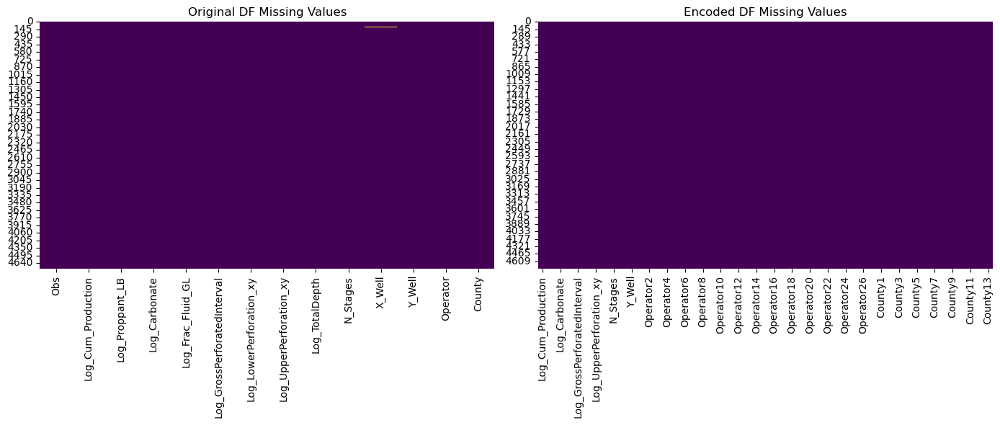

In [9]:
# Create a figure with two subplots (1 row, 2 columns)
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Heatmap for df showing missing values
sns.heatmap(df.isnull(), cbar=False, cmap="viridis", ax=axes[0])
axes[0].set_title('Original DF Missing Values')

# Heatmap for encoded_df showing missing values
sns.heatmap(encoded_df.isnull(), cbar=False, cmap="viridis", ax=axes[1])
axes[1].set_title('Encoded DF Missing Values')

# Display the plots
plt.tight_layout()
plt.show()


## Plot  Histogram of vales and distrobutions

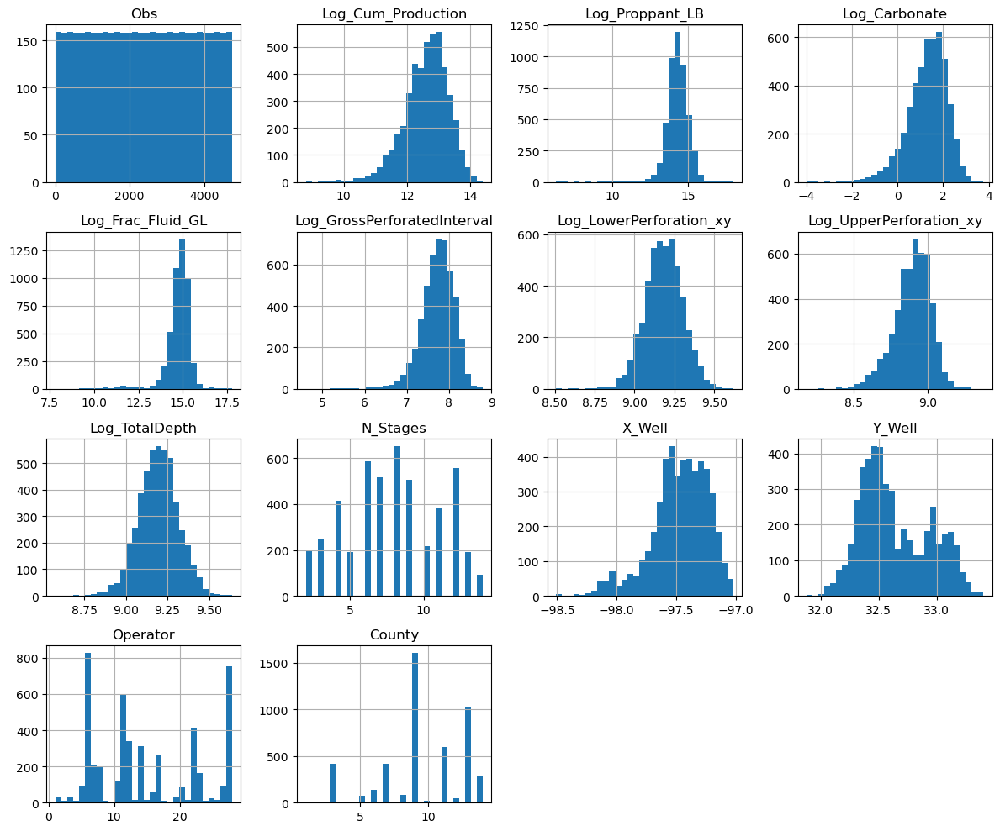

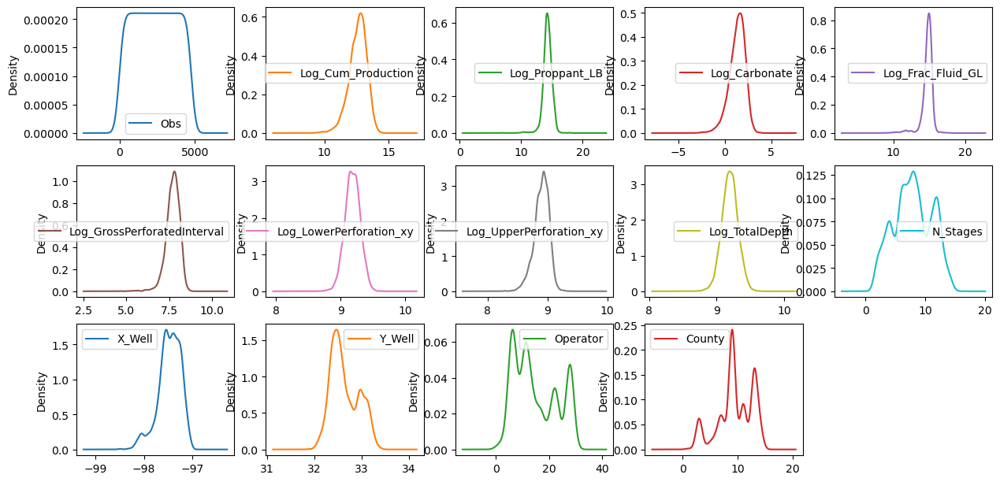

In [10]:
# Histogram for numeric columns
df.hist(figsize=(12, 10), bins=30)
plt.tight_layout()
plt.show()

# Kernel Density Estimate (KDE) plot for visualizing distributions
df.plot(kind='density', subplots=True, layout=(4, 5), figsize=(15, 10), sharex=False)
plt.show()


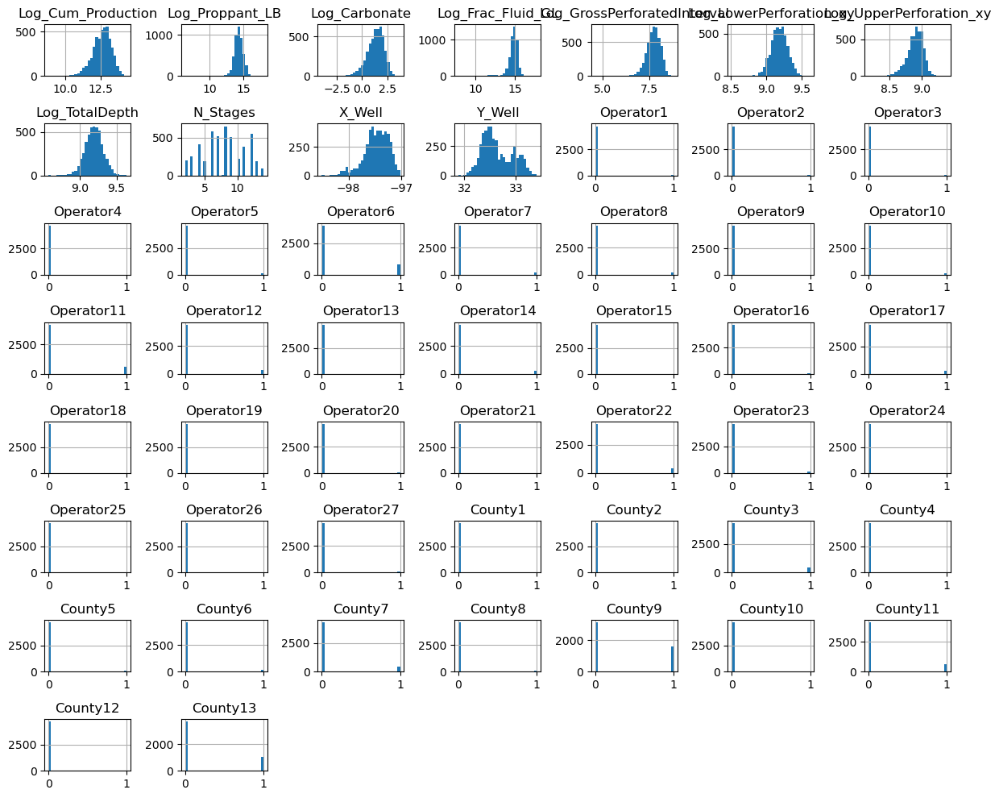

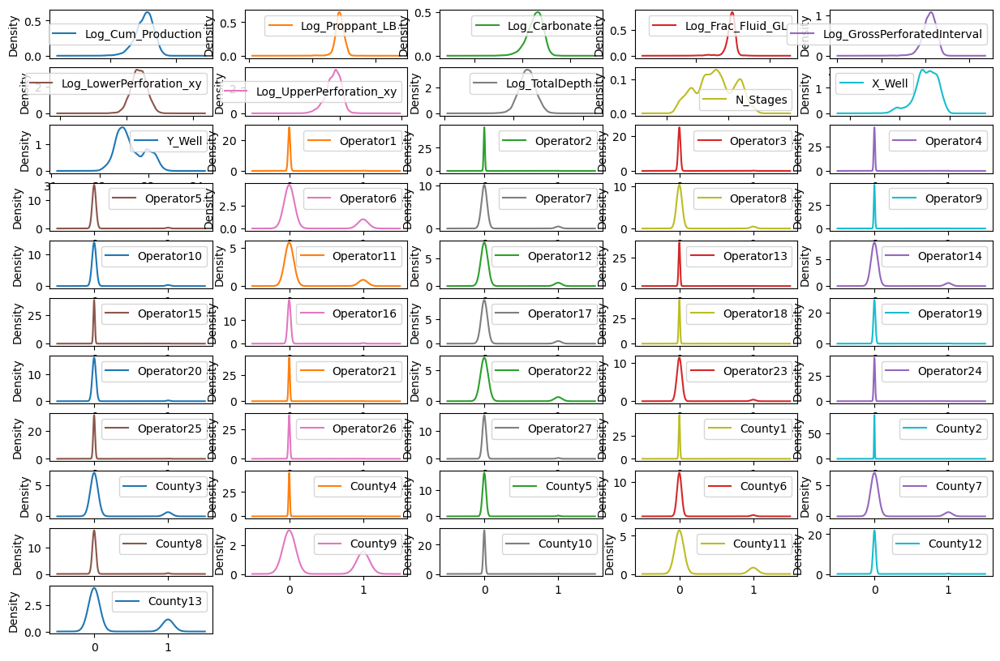

In [11]:
# Histogram for numeric columns
encoded_df.hist(figsize=(12, 10), bins=30)
plt.tight_layout()
plt.show()

# Kernel Density Estimate (KDE) plot for visualizing distributions
encoded_df.plot(kind='density', subplots=True, layout=(11, 5), figsize=(15, 10), sharex=False)
plt.show()

## Plot the Correaltion Matrix of the varibles

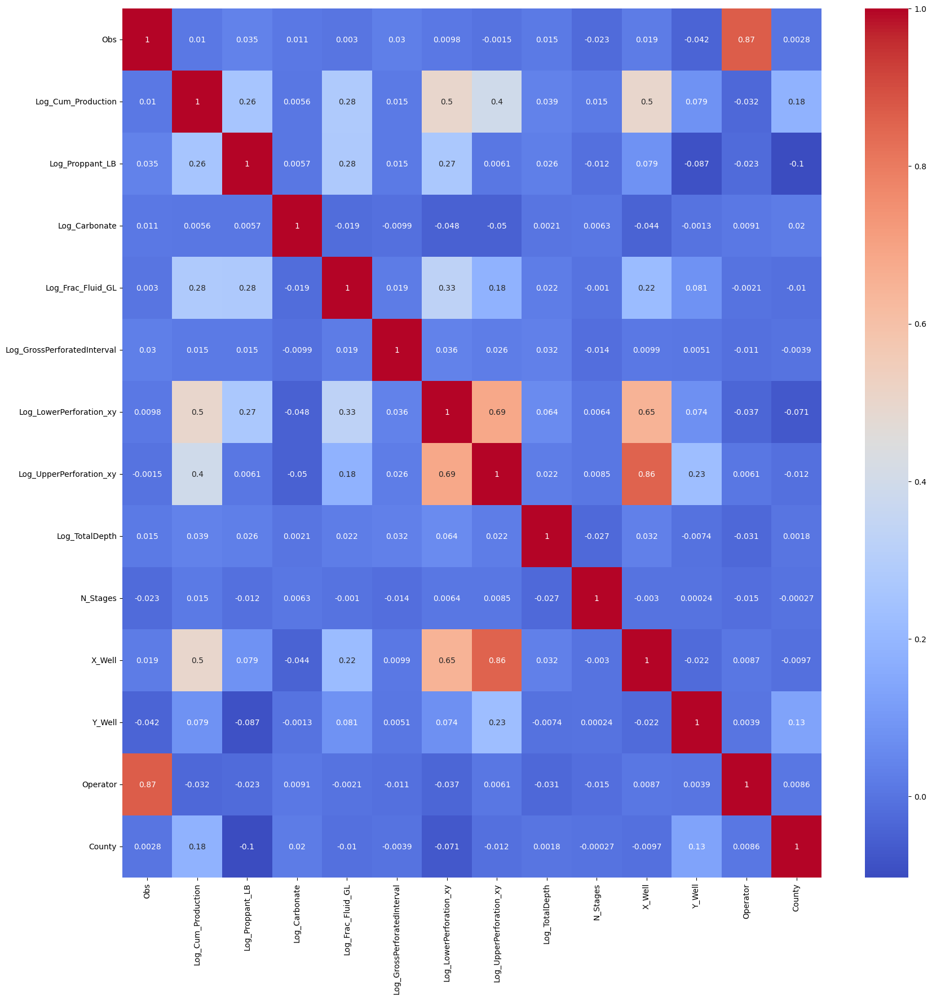

In [12]:
#import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Select only numeric columns from the DataFrame
numeric_df = df.select_dtypes(include=[float, int])

# Now, calculate the correlation matrix on the filtered numeric columns
correlation_matrix = numeric_df.corr()

# Visualize the correlation matrix with a heatmap
plt.figure(figsize=(20,20))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.show()


<Figure size 2000x1600 with 0 Axes>

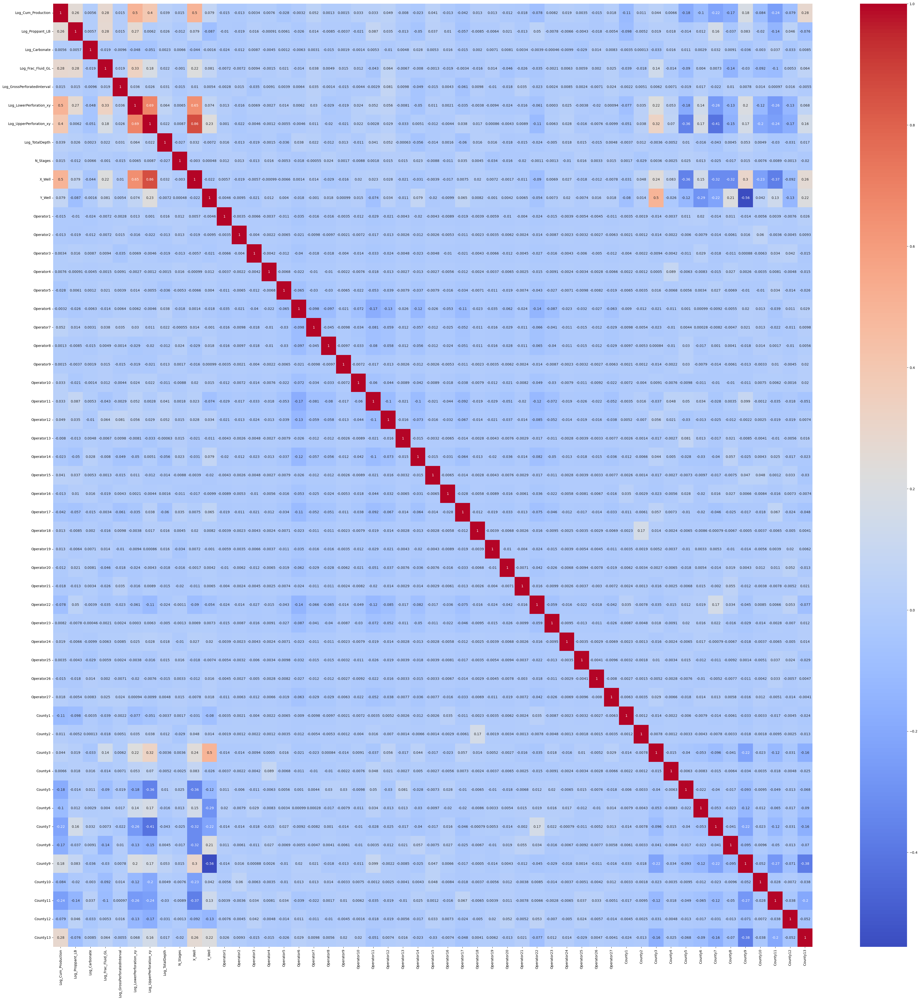

In [13]:

# Select only numeric columns from encoded DataFrame
encoded_numeric_df = encoded_df.select_dtypes(include=[float, int])

# Calculate the correlation matrix on the filtered numeric columns
correlation_matrix = encoded_numeric_df.corr()

# Set the figure size to make the chart larger
plt.figure(figsize=(20, 16))  # You can adjust the size as needed

# Visualize the correlation matrix with a heatmap
plt.figure(figsize=(50,50))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')

# Show the plot
plt.show()



## Plots the clusters of the numeric varibles

C:\Users\akhil\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


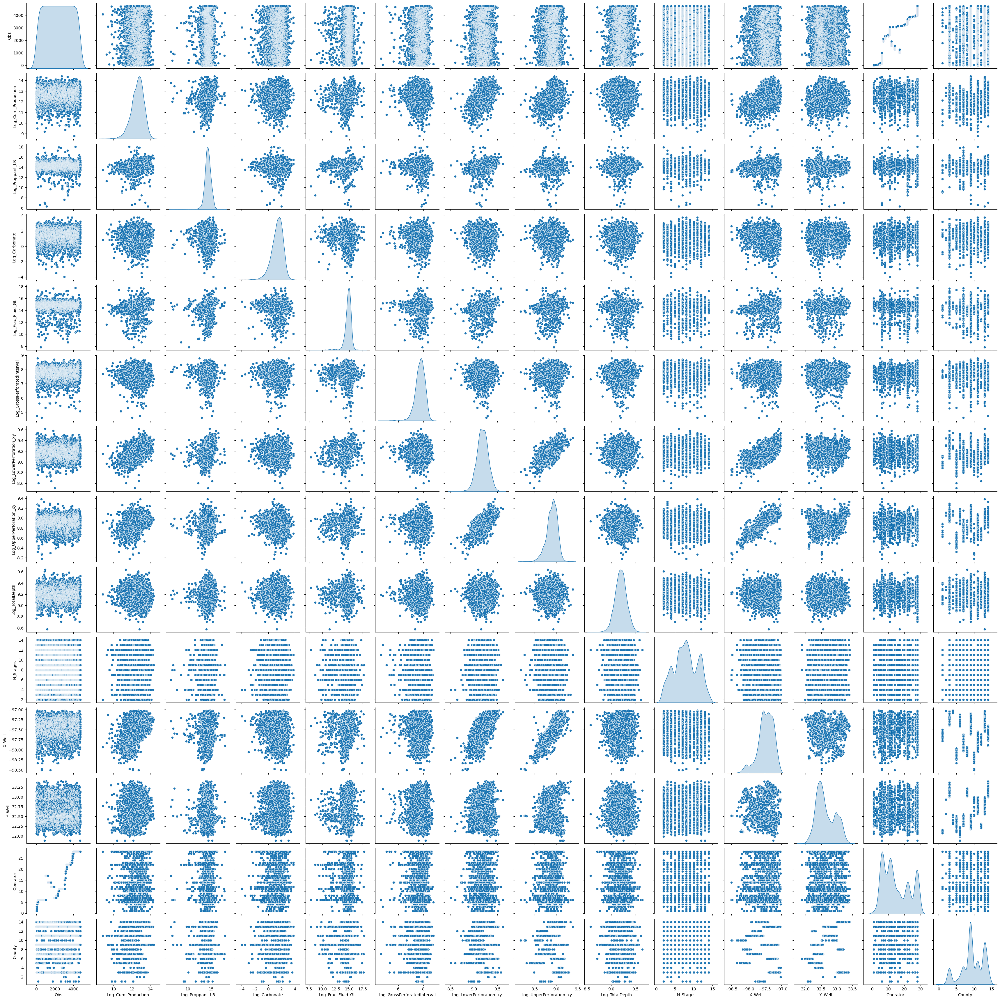

In [14]:
# Pairplot to visualize pairwise relationships between numerical variables
sns.pairplot(df, diag_kind='kde')
plt.show()


## the box plot to find outliers between numeric and categorical varibles

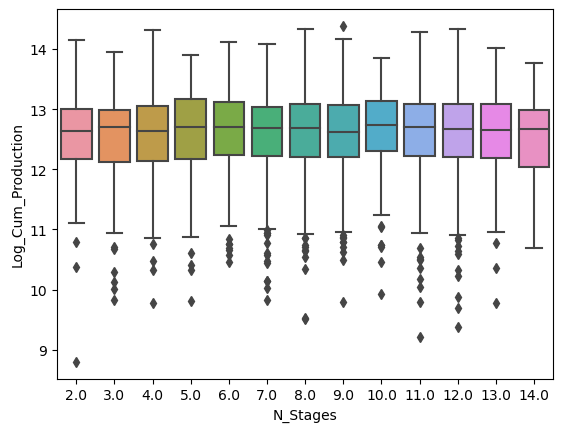

In [15]:

# Replace 'cut' with the actual categorical column and 'price' with the actual numerical column from your DataFrame
sns.boxplot(x='N_Stages', y='Log_Cum_Production', data=df)

# Display the plot
plt.show()



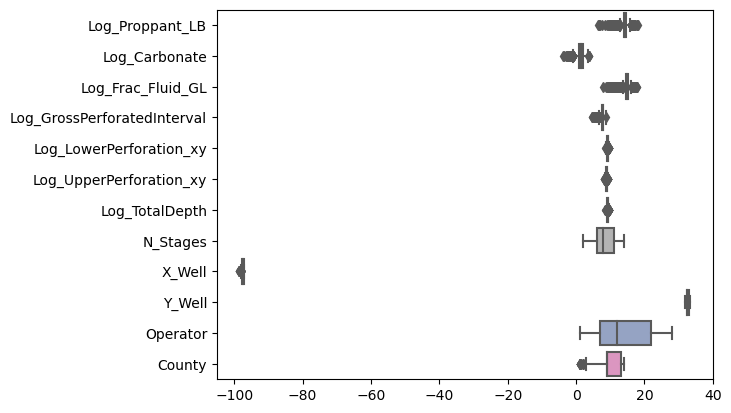

In [16]:
# Drop the 'obs' column from the DataFrame if it's present
df_no_obs = df.drop(columns=['Obs', 'Log_Cum_Production'], errors='ignore')  # errors='ignore' ensures no error is raised if 'obs' doesn't exist

# Create the boxplot without the 'obs' column
sns.boxplot(data=df_no_obs, orient='h', palette='Set2')

# Show the plot
plt.show()


## Frequency Plots

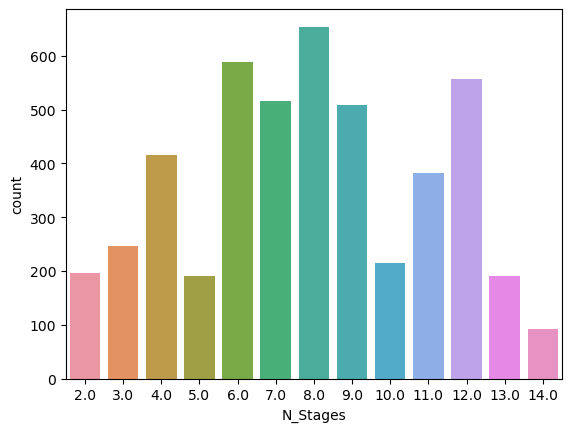

In [17]:
# Countplot to visualize the frequency distribution of categories
sns.countplot(x='N_Stages', data=df)
import plotly.express as px

# Interactive scatter plot
fig = px.scatter(df, x='Log_Cum_Production', y='Log_Proppant_LB', color='N_Stages')

# Update layout to make the plot taller and move the legend to the bottom right
fig.update_layout(
    height=800,  # Set height to make the plot vertically larger
    legend=dict(
        x=1,       # Position legend on the right (1 = far right)
        y=0,       # Position legend at the bottom (0 = bottom)
        xanchor='right',  # Anchor the legend to the right
        yanchor='bottom', # Anchor the legend to the bottom
        orientation='v',  # Ensure the legend is vertical
    )
)

# Show the plot
fig.show()
plt.show()


In [18]:
import plotly.express as px

# Interactive scatter plot
fig = px.scatter(df, x='Log_Cum_Production', y='Log_Proppant_LB', color='N_Stages')

# Calculate the average of the 'Carat' column
carat_mean = df['Log_Proppant_LB'].mean()

# Update layout to make the plot taller and move the legend to the bottom right
fig.update_layout(
    height=800,  # Set height to make the plot vertically larger
    legend=dict(
        x=1,        # Position legend on the right (1 = far right)
        y=0,        # Position legend at the bottom (0 = bottom)
        xanchor='right',
        yanchor='bottom',
        orientation='v',
    )
)

# Add a horizontal line for the average of 'Carat'
fig.add_shape(
    type="line",
    x0=df['Log_Cum_Production'].min(),  # Start line from the minimum 'price'
    y0=carat_mean,         # Y position is the average of 'Carat'
    x1=df['Log_Cum_Production'].max(),  # End line at the maximum 'price'
    y1=carat_mean,         # Keep the Y position the same (horizontal line)
    line=dict(color="Red", width=3, dash="dash")  # Customize the line appearance
)

# Show the plot
fig.show()




In [19]:
import plotly.express as px

# Defining a custom vibrant color palette for better visibility
vibrant_colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']

# Creating the bar plot with vibrant colors
fig = px.bar(df, y='Log_Cum_Production', x='N_Stages', color_discrete_sequence=vibrant_colors)

# Update layout to set a darker background
fig.update_layout(
    plot_bgcolor='white',  # Setting the plot background to white for contrast
    paper_bgcolor='white',  # Setting the paper background to white
    font=dict(color='black')  # Make the font color black for visibility
)

# Show the plot
fig.show()


In [20]:
""" **********************************************************************  """
# Title: Performing stepwise regression with AdvancedAnalytics package, using 'price' as the target
""" STEPWISE REGRESSION USING AdvancedAnalytics with Target=price           """ 



# Initialize the stepwise regression process:
# 'encoded_df_' is the data to be used, and 'target' specifies the dependent variable ('price')
# 'reg="linear"' specifies that this is a linear regression model
# 'method="stepwise"' applies stepwise selection (both forward and backward)
# 'crit_in=0.1' and 'crit_out=0.1' are significance criteria for including and excluding variables
# 'verbose=True' enables detailed output of the stepwise regression process
sw = stepwise(encoded_df, target, reg="linear", method="stepwise", 
              crit_in=0.1, crit_out=0.1, verbose=True)

# Print a message indicating the stepwise process is starting with the specified target variable
print("\nRunning Stepwise with Target: ", target)

# Perform the stepwise regression, selecting the most significant variables
selected = sw.fit_transform()
""" **********************************************************************  """



Running Stepwise with Target:  Log_Cum_Production
Add  Log_LowerPerforation_xy        with p-value 4.056e-295
Add  County13                       with p-value 5.99877e-92
Add  County9                        with p-value 1.23249e-61
Add  Log_Proppant_LB                with p-value 2.64986e-40
Add  Y_Well                         with p-value 4.22674e-34
Add  X_Well                         with p-value 1.13925e-21
Add  Log_UpperPerforation_xy        with p-value 7.2829e-28
Add  Log_Frac_Fluid_GL              with p-value 4.61247e-13
Add  County3                        with p-value 2.79897e-07
Add  County8                        with p-value 9.39085e-06
Add  County1                        with p-value 0.000374608
Add  County6                        with p-value 0.00154046
Add  Operator15                     with p-value 0.0061388
Add  Log_Carbonate                  with p-value 0.00842697
Add  Operator7                      with p-value 0.0177631
Add  Operator5                      with p

' **********************************************************************  '

In [27]:
# Compute the log-likelihood of the model using the estimated parameters

X = sm.add_constant(X)

# Fit an Ordinary Least Squares (OLS) regression model
model = sm.OLS(y, X)
results = model.fit()


ll = model.loglike(results.params)

# Calculate the degrees of freedom for the model, adding 2 to account for the intercept and sigma
model_df = model.df_model + 2  # plus intercept and sigma

# Get the number of observations (nobs) from the dependent variable 'y'
nobs = y.shape[0]

# Calculate Akaike Information Criterion (AIC) using the log-likelihood, number of observations, and model degrees of freedom
aic = em.aic(ll,  nobs, model_df)

# Calculate Bayesian Information Criterion (BIC) using the log-likelihood, number of observations, and model degrees of freedom
bic = em.bic(ll,  nobs, model_df)

# Calculate corrected Akaike Information Criterion (AICC) to account for finite sample sizes
aicc = em.aicc(ll, nobs, model_df)

# Print the results for AICC, AIC, and BIC, comparing them to reference values from SAS
print("\n")
print("AICC: ", aicc, "AIC: ", aic, "BIC: ", bic)




AICC:  39.75390643044347 AIC:  39.11560855810305 BIC:  52.14145948804351


In [28]:
# Print a line of asterisks for visual separation of results in the output
print("\n*******************************************************")

# Print a title indicating that the target variable in the regression model is 'Price'
print("                                   Target: Price        ")

# Print a detailed summary of the regression model results, including coefficients, p-values, and diagnostics
print(results.summary())

# Print another line of asterisks to visually conclude the results section
print("\n*******************************************************")



*******************************************************
                                   Target: Price        
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.015
Model:                            OLS   Adj. R-squared:                 -0.015
Method:                 Least Squares   F-statistic:                    0.5035
Date:                Mon, 16 Sep 2024   Prob (F-statistic):              0.681
Time:                        23:26:33   Log-Likelihood:                -14.558
No. Observations:                 100   AIC:                             37.12
Df Residuals:                      96   BIC:                             47.54
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------

In [29]:
# Get the predicted values (fitted values) from the regression model
predicted = results.fittedvalues

# Get the residuals (difference between observed and predicted values) from the regression model
residual = results.resid

# Get influence statistics (e.g., leverage, Cook's distance) for diagnosing influential data points
influence = results.get_influence()

# Get the number of observations (nobs) from the dependent variable 'y'
nobs = y.shape[0]

# Calculate the expected number of observations outside +/- 3 standard deviations (3Sigma)
n3 = 2.0 * (1.0 - norm.cdf(3.0)) * nobs

# Calculate the expected number of observations outside +/- 4 standard deviations (4Sigma)
n4 = 2.0 * (1.0 - norm.cdf(4.0)) * nobs

# Calculate the expected number of observations outside +/- 6 standard deviations (6Sigma)
n6 = 2.0 * (1.0 - norm.cdf(6.0)) * nobs

# Print a message indicating that the following output refers to expected observation counts beyond certain limits
print("\nExpected number of observations outside stated limits:")

# Print the expected number of observations outside +/- 3 standard deviations
print("+/- 3Sigma: ", int(round(n3)))

# Print the expected number of observations outside +/- 4 standard deviations
print("+/- 4Sigma: ", int(round(n4)))

# Print the expected number of observations outside +/- 6 standard deviations
print("+/- 6Sigma: ", int(round(n6)))




Expected number of observations outside stated limits:
+/- 3Sigma:  0
+/- 4Sigma:  0
+/- 6Sigma:  0


In [30]:
# Print a new line for formatting purposes
print("\n")

# Extract the leverage values (diagonal of the hat matrix) from the influence statistics
leverage = influence.hat_matrix_diag

# Extract Cook's distance values from the influence statistics (used to detect influential data points)
cooks_d = influence.cooks_distance[0]

# Calculate the cutoff value for Cook's distance based on the formula 4/n (where n is the number of observations)
cutoffD = 4.0 / nobs

# Print the maximum Cook's distance and the cutoff value for flagging influential points
print("Max Cooks D: {:8.4f}  Cutoff ( 4/n): {:8.5f}".format(cooks_d.max(), cutoffD))

# Calculate the cutoff value for leverage based on the formula 2p/n (where p is the model degrees of freedom)
cutoffH = 2.0 * model_df / nobs

# Print the maximum leverage value and the cutoff for identifying high-leverage points
print("Max H:       {:8.4f}  Cutoff (2p/n): {:8.5f}".format(leverage.max(), cutoffH))




Max Cooks D:   0.0360  Cutoff ( 4/n):  0.04000
Max H:         0.0733  Cutoff (2p/n):  0.10000


In [31]:
# Calculate standardized residuals by dividing the residuals by the square root of the mean squared error of residuals
std_residuals = residual / np.sqrt(results.mse_resid)

# Get the studentized residuals (internally adjusted residuals that account for leverage and variance)
stud_residuals = influence.resid_studentized_internal

# Identify the indices of studentized residuals greater than 6 (extreme positive outliers)
outliers = np.nonzero(stud_residuals > 6)[0]

# Append indices of studentized residuals less than -6 (extreme negative outliers)
outliers = np.append(outliers, np.nonzero(stud_residuals < -6)[0])

# Print the total number of residuals that exceed +/- 6 standard deviations
print("\nNumber of Residuals beyond +/-6 sigma for Log(price):", 
      outliers.shape[0])

# Print a header indicating the list of residuals that are beyond the +/- 6 sigma limit
print("Residuals beyond +/-6 sigma:")

# Print a separator line to visually structure the output
print("*******************************************************")

# Print column headers for the output table listing the case number, observed values, predicted values, and studentized residuals
print(" Case      Observed      Predicted       Stud. Resid.")

# Identify and print the indices of studentized residuals greater than 6
outliers = np.nonzero(stud_residuals > 6)[0]
for case in outliers:
    # Print each case's index, observed value, predicted value, and studentized residuals for positive outliers
    print("{:5d}{:13.2f}{:14.2f}{:17.2f}". 
          format(case, y[case], predicted[case], stud_residuals[case]))

# Identify and print the indices of studentized residuals less than -6
outliers = np.nonzero(stud_residuals < -6)[0]
for case in outliers:
    # Print each case's index, observed value, predicted value, and studentized residuals for negative outliers
    print("{:5d}{:13.2f}{:14.2f}{:17.2f}". 
          format(case, y[case], predicted[case], stud_residuals[case]))

# Print an empty line for better readability
print("")

# Print a separator line for visual separation of the summary section
print("\n*******************************************************")

# Print headers for the summary statistics for observed, predicted, and residual values
print("                             Min      Mean        Max")

# Print the minimum, mean, and maximum values of the observed variable 'y'
print("Observed:              {:10.4f} {:10.4f} {:10.4f}".
      format(y.min(),  y.mean(), y.max()))

# Print the minimum, mean, and maximum values of the predicted variable
print("Predicted:             {:10.4f} {:10.4f} {:10.4f}".
      format(predicted.min(),  predicted.mean(), predicted.max()))

# Print the minimum, mean, and maximum values of the residuals
print("Residuals:            {:10.4f} {:10.4f} {:10.4f}".
      format(residual.min(),  residual.mean(), residual.max()))

# Print the minimum, mean, and maximum values of the standardized residuals
print("Standardized Residuals:{:10.4f} {:10.4f} {:10.4f}".
      format(std_residuals.min(), std_residuals.mean(), std_residuals.max()))

# Print the minimum, mean, and




Number of Residuals beyond +/-6 sigma for Log(price): 0
Residuals beyond +/-6 sigma:
*******************************************************
 Case      Observed      Predicted       Stud. Resid.


*******************************************************
                             Min      Mean        Max
Observed:                  0.0096     0.4985     0.9982
Predicted:                 0.4315     0.4985     0.5726
Residuals:               -0.4973     0.0000     0.4931
Standardized Residuals:   -1.7410     0.0000     1.7262


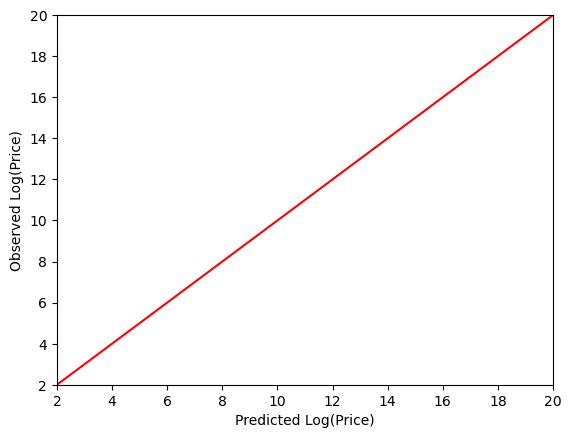

KeyError: 'price'

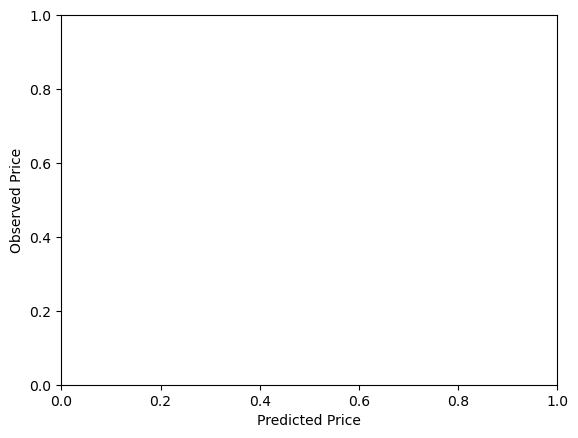

In [32]:
# Using MatPlot for residual and influence graphics
# Plot of Observed Values versus the Predicted Values
plt.figure()
plt.xlabel("Predicted Log(Price)")
plt.ylabel("Observed Log(Price)")
plt.plot(predicted, y, "bo", markersize=1.5)
plt.plot( [2,20], [2,20], "r", linewidth=1.5)
plt.axis([2, 20, 2, 20])
plt.show()

pred = np.exp(predicted)
plt.figure()
plt.xlabel("Predicted Price")
plt.ylabel("Observed Price")
plt.plot(pred, encoded_df['price'], "bo", markersize=1.5)
plt.plot( [300,20000], [300, 20000], "r", linewidth=1.5)
plt.axis([ 0, 115000, 300, 19000])
plt.show()


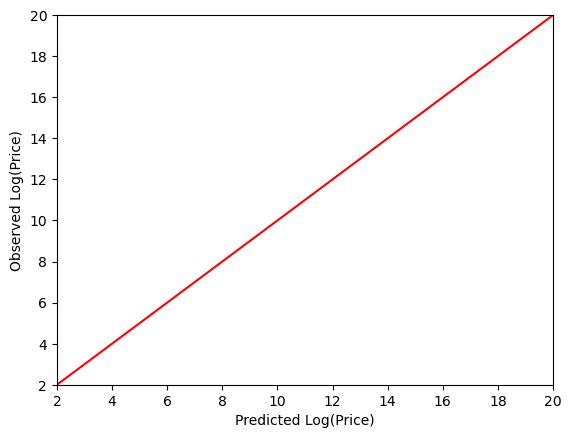

KeyError: 'price'

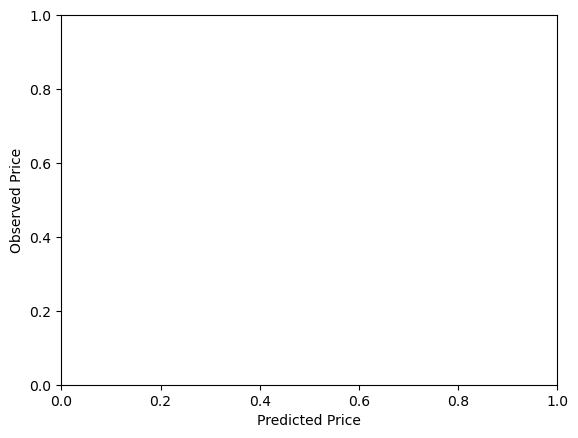

In [33]:
# Using MatPlot for residual and influence graphics
# Plot of Observed Values versus the Predicted Values
plt.figure()
plt.xlabel("Predicted Log(Price)")
plt.ylabel("Observed Log(Price)")
plt.plot(predicted, y, "bo", markersize=1.5)
plt.plot( [2,20], [2,20], "r", linewidth=1.5)
plt.axis([2, 20, 2, 20])
plt.show()

pred = np.exp(predicted)
plt.figure()
plt.xlabel("Predicted Price")
plt.ylabel("Observed Price")
plt.plot(pred, encoded_df['price'], "bo", markersize=1.5)
plt.plot( [300,20000], [300, 20000], "r", linewidth=1.5)
plt.axis([ 0, 115000, 300, 19000])
plt.show()


C:\Users\akhil\AppData\Local\Temp\ipykernel_14200\3069202895.py:6: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



KeyError: 'Carat'

<Figure size 640x480 with 0 Axes>

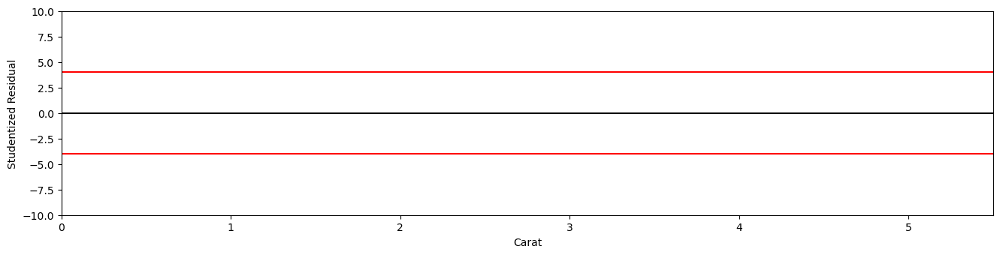

In [34]:
# Multiplot of 1.  Carat vs Studentized Residuals, 
#              2.  Predicted Value vs. Studentized Residuals, and
#              3.  Cook's D vs. Studentized Residuals
plt.figure()
plt.subplots(figsize=(16,12))
plt.subplot(311)
plt.xlabel("Carat")
plt.ylabel("Studentized Residual")
plt.axis([0,5.5, -10.0, +10.0])
plt.axhline(0, color="k")
plt.axhline(4, color="r")
plt.axhline(-4, color="r")
plt.plot(encoded_df['Carat'], stud_residuals, "bo", markersize=5)

plt.subplot(312)
plt.xlabel("Predicted Price")
plt.ylabel("Studentized Residual")
plt.axis([0, 40000, -10.0, +10.0])
#plt.axis([4, 14, -10.0, +10.0])
plt.axhline(0, color="k")
plt.axhline(4, color="r")
plt.axhline(-4, color="r")
plt.plot(pred, stud_residuals, 'bo', markersize=5)

plt.subplot(313)
plt.xlabel("Cooks'D")
plt.ylabel("Studentized Residual")
plt.axis([0,0.05, -10.0, +10.0])
plt.axhline(0, color="k")
plt.axhline(4, color="r")
plt.axhline(-4, color="r")
plt.axvline(cutoffD, color="g")
plt.plot(cooks_d, stud_residuals, 'bo', markersize=5)
plt.text(cutoffD+0.00005, -9, "Cutoff = (4 / n) = 0.00089", fontsize=12)
plt.show()

In [ ]:
X_train, X_validate, y_train, y_validate =  \
    train_test_split(Xc, y, test_size=0.3, random_state = 12345)

model    = sm.OLS(y_train, X_train)  # Using StatsModels for Linear Regression
results  = model.fit()
print("\n*******************************************************")
print("                              Target: Log(Price)       ")
print(results.summary())
print("\n*******************************************************\n")

print("AdvancedAnalytics Display Split Metrics:")
linreg.display_split_metrics(results, X_train,y_train, X_validate,y_validate)

*******************************************************
                              Target: Log(Price)       
                            OLS Regression Results  
                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.856
Model:                            OLS   Adj. R-squared:                  0.856
Method:                 Least Squares   F-statistic:                     9772.
Date:                Sun, 08 Sep 2024   Prob (F-statistic):               0.00
Time:                        19:07:30   Log-Likelihood:            -3.3028e+05
No. Observations:               37758   AIC:                         6.606e+05
Df Residuals:                   37734   BIC:                         6.608e+05
Df Model:                          23                                         
Covariance Type:            nonrobust             

=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
                    
---------------------------------------------------------------------------------
const         -1.399e+04    575.378    -24.307      0.000   -1.51e+04   -1.29e+04
z               434.9248     35.659     12.197      0.000     365.033     504.817
clarity3:SI2  -2317.5803     33.727    -68.716      0.000   -2383.686   -2251.475
clarity2:SI1  -1474.9053     30.580    -48.231      0.000   -1534.843   -1414.968
x               943.0182     32.227     29.261      0.000     879.851    1006.185
clarity0:I1   -4679.0826     76.595    -61.088      0.000   -4829.211   -4528.954
Carat          3980.2970     44.933     88.583      0.000    3892.227    4068.367
clarity5:VS2   -830.4261     31.060    -26.737      0.000    -891.304    -769.549
clarity4:VS1   -552.3836     33.058    -16.709      0.000    -617.179    -487.588
y               942.4624     31.953     29.495      0.000     879.834    1005.091
color0:D       1977.8822     42.734     46.283      0.000    1894.122    2061.643
color1:E       1773.1861     40.801     43.459      0.000    1693.215    1853.158
color2:F       1670.6127     40.641     41.107      0.000    1590.955    1750.270
color3:G       1510.5032     39.383     38.355      0.000    1433.312    1587.694
color4:H       1147.4628     40.883     28.067      0.000    1067.331    1227.594
color5:I        825.5304     43.331     19.052      0.000     740.600     910.460
cut0:Fair      -783.2336     52.898    -14.807      0.000    -886.914    -679.553
cut1:Good      -223.0878     32.136     -6.942      0.000    -286.075    -160.101
clarity1:IF     480.1388     51.074      9.401      0.000     380.032     580.245
depth            42.6467      6.717      6.349      0.000      29.481      55.812
cut2:Ideal       81.3528     22.372      3.636      0.000      37.503     125.202
clarity6:VVS1   108.6705     40.114      2.709      0.007      30.046     187.295
cut3:Premium     70.7942     23.712      2.986      0.003      24.317     117.271
table           -10.5907      4.544     -2.331      0.020     -19.496      -1.685


==============================================================================
Omnibus:                    15141.400   Durbin-Watson:                   1.999
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           115092.245
Skew:                           1.744   Prob(JB):                         0.00
Kurtosis:                      10.809   Cond. No.                     6.23e+03

==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.23e+03. This might indicate that there are
strong multicollinearity or other numerical problems.

*******************************************************

AdvancedAnalytics Display Split Metrics:


Model Metrics..........       Training     Validation
Observations...........          37758          16182
Coefficients...........             25             25
DF Error...............          37733          16157
R-Squared..............         0.8562         0.8445
Adj. R-Squared.........         0.8562         0.8443
Mean Absolute Error....      1116.9558      1097.2200
Median Absolute Error..       924.6585       903.9471
Avg Squared Error......   2319251.8168   2394619.2761
Square Root ASE........      1522.9090      1547.4557
Log Likelihood.........   -330281.1625   -141807.8167
AIC           .........    660614.3251    283667.6334
AICc          .........    660614.3623    283667.7203
BIC           .........    660836.3378    283867.6164
​